In [1]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [2]:
%matplotlib inline

In [3]:
import sys
sys.path.insert(0,"../python")

In [4]:
# set directories
outdir = "../oldnew_figures"
basedir = "/scratch/gpfs/changgoo/tigress_classic/"

In [5]:
from cr_zprof import cr_data_load, load_group, load_windpdf, load_velocity_pdfs

In [6]:
model_dict = cr_data_load(basedir)

Available models in /scratch/gpfs/changgoo/tigress_classic/:
  - crmhd-16pc-b1-diode-diode-sigma_selfc-Vmax2
  - crmhd-16pc-b1-diode-diode-sigma_selfc-Vmax2-tall
  - crmhd-16pc-b1-diode-lngrad_out-sigma_selfc-Vmax2
  - crmhd-16pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-tall
  - crmhd-16pc-b1-lngrad_out-lngrad_out-sigma_selfc-Vmax2
  - crmhd-16pc-b1-lngrad_out-lngrad_out-sigma_selfc-Vmax2-tall
  - crmhd-8pc-b0.1-diode-lngrad_out-sigma_selfc-Vmax2
  - crmhd-8pc-b1-diode-lngrad_out-sigma27_va1
  - crmhd-8pc-b1-diode-lngrad_out-sigma28_va-1
  - crmhd-8pc-b1-diode-lngrad_out-sigma28_va0
  - crmhd-8pc-b1-diode-lngrad_out-sigma28_va1
  - crmhd-8pc-b1-diode-lngrad_out-sigma29_va-1
  - crmhd-8pc-b1-diode-lngrad_out-sigma29_va0
  - crmhd-8pc-b1-diode-lngrad_out-sigma29_va1
  - crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax10
  - crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax10-rst2
  - crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2
  - crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst
  - crmhd

In [7]:
# model initialization
model_name = {
    "crmhd_v2-8pc-b1-diode-lngrad_out": "crmhd-old",
    "crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst": "crmhd-new",
    # "crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst": "crmhd-rst",
    # "crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst2": "crmhd-rst2",
}

model_color = {
    "crmhd_v2-8pc-b1-diode-lngrad_out": "#009EFF",
    "crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst": "#E77500",
    # "crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst": "C1",
    # "crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst2": "C2",
}

In [8]:
from load_sim_tigresspp import LoadSimTIGRESSPPAll

In [9]:
# load simulations
sa = LoadSimTIGRESSPPAll(model_dict)
simgroup = dict()
group = "oldnew"
simgroup[group] = {m: sa.set_model(m, verbose=True) for m in model_name}
sims = simgroup[group]

[LoadSimTIGRESSPP-INFO] basedir: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx
[LoadSimTIGRESSPP-INFO] savdir: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx
[LoadSimTIGRESSPP-INFO] load_method: xarray
[FindFiles-INFO] athinput: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/athinput.runtime
[FindFiles-INFO] athena_variant: Athena++
[FindFiles-INFO] problem_id: TIGRESS
[FindFiles-INFO] hdf5 (prim,uov): /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx nums: 0-100
[FindFiles-INFO] parbin (par0): /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx nums: 0-100
[FindFiles-INFO] parhst: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx pids: 1-407
[FindFiles-INFO] loop_time: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-ic

In [10]:
# load data
load_group(simgroup, group)

loading crmhd_v2-8pc-b1-diode-lngrad_out...


[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/merged_zprof/merged_zprof.nc
[LoadSimTIGRESSPP-INFO] [read_hst]: Reading pickle.


loading crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst...


[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/changgoo/tigress_classic/crmhd-8pc-b1-mhdbc_diode-crbc_lngrad_out-sigma_selfc-Vmax2-rst/merged_zprof/merged_zprof.nc
[LoadSimTIGRESSPP-INFO] [read_hst]: Reading pickle.


In [11]:
for m,s in sims.items():
    s.tslice=slice(200,500)

In [12]:
s = sims["crmhd_v2-8pc-b1-diode-lngrad_out"]
zp = s.load_zprof_postproc()
load_windpdf(s, both=True)

[LoadSimTIGRESSPP-INFO] save folder is set to /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/zprof_postproc
[LoadSimTIGRESSPP-INFO] reading: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/zprof_postproc/TIGRESS.00000.zprof.nc
[LoadSimTIGRESSPP-INFO] reading: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/zprof_postproc/TIGRESS.00001.zprof.nc
[LoadSimTIGRESSPP-INFO] reading: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/zprof_postproc/TIGRESS.00002.zprof.nc
[LoadSimTIGRESSPP-INFO] reading: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/zprof_postproc/TIGRESS.00003.zprof.nc
[LoadSimTIGRESSPP-INFO] reading: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/zprof_postproc/TIGRESS.00004.zprof.nc
[LoadSimTIGRESSPP-INFO] reading: /scratch/gpfs/changgoo/

In [13]:
for m, s in sims.items():
    load_windpdf(s, both=True)
    # load_velocity_pdfs(s)

In [14]:
import plotting_scripts as ps
# setup for plotting scripts
ps.setup(outdir, model_name, model_color)

In [15]:
model_list = list(model_name.keys())

crmhd-old sfr40 0.003626868260966446 0.0016480427818002738
crmhd-new sfr40 0.003618401188045792 0.0010432405710473064
crmhd-old Sigma_gas 7.489235422505765 10.529266672796103
crmhd-new Sigma_gas 7.856706284548293 10.46718815489521
crmhd-old Sigma_out 0.8618253087733733 2.8597040053772353
crmhd-new Sigma_out 0.8138583323846769 2.3678779846034477


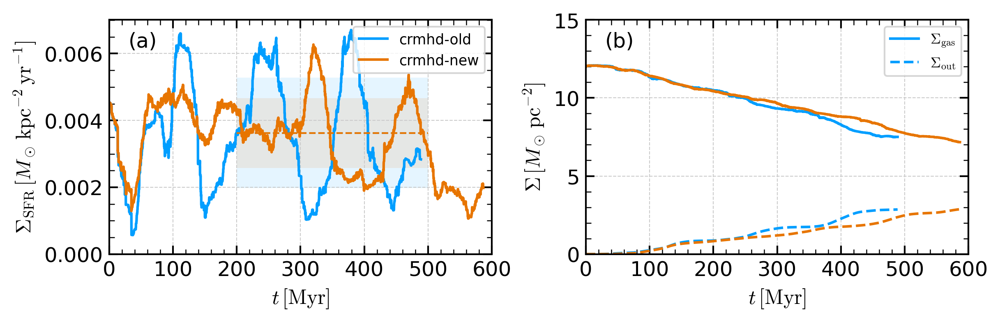

In [16]:
fig = ps.plot_history(simgroup, group, tmax=600)

crmhd-old Pok_cr 7627.549288511861 2067.06390297957
crmhd-old Pok_th 3536.688027226929 1392.6621374318206
crmhd-old Pok_kin 14370.262834365723 8572.444257097579
crmhd-old Pi_B 1753.6469025318984 1489.0093987925964
crmhd-new Pok_cr 11417.381660361032 1536.3784188417883
crmhd-new Pok_th 3878.1466238465796 1042.4113032996215
crmhd-new Pok_kin 13948.027285816841 5528.363712180743
crmhd-new Pi_B 1315.8001677127427 741.5901782631819
crmhd_v2-8pc-b1-diode-lngrad_out 814.3798691792418 259.51278637974997
crmhd_v2-8pc-b1-diode-lngrad_out rho: P0=1.74e+00, H=0.199 kpc
crmhd_v2-8pc-b1-diode-lngrad_out Pok_cr: P0=7.67e+03, H=6.939 kpc
crmhd_v2-8pc-b1-diode-lngrad_out Pok_th: P0=3.78e+03, H=0.326 kpc
crmhd_v2-8pc-b1-diode-lngrad_out Pok_kin: P0=1.23e+04, H=0.489 kpc
crmhd_v2-8pc-b1-diode-lngrad_out Pi_B: P0=1.47e+03, H=0.174 kpc
crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst 823.6805259587672 252.47594441102325
crmhd-8pc-b1-diode-lngrad_out-sigma_selfc-Vmax2-rst rho: P0=1.83e+00, H=0.199 kpc
cr

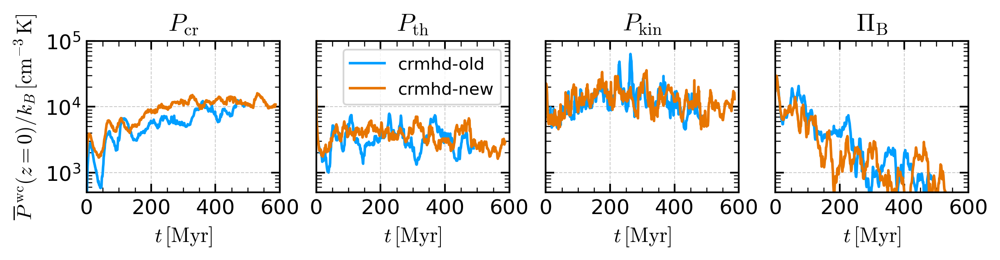

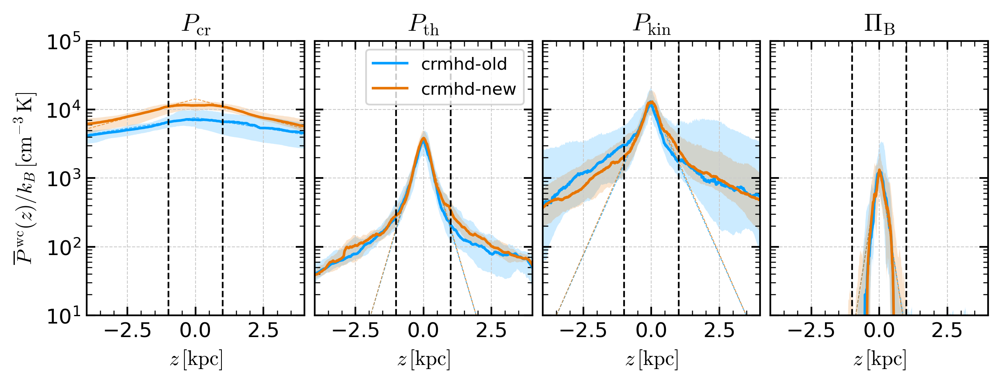

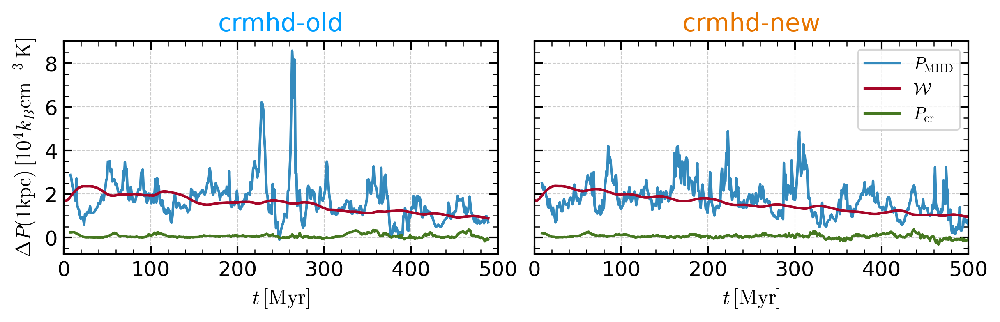

In [17]:
zslice = slice(-50, 50)
f=ps.plot_pressure_t(simgroup, group, zslice=zslice)
f=ps.plot_pressure_z(simgroup, group)
f=ps.plot_vertical_equilibrium_t(simgroup, group, zmax=1000)

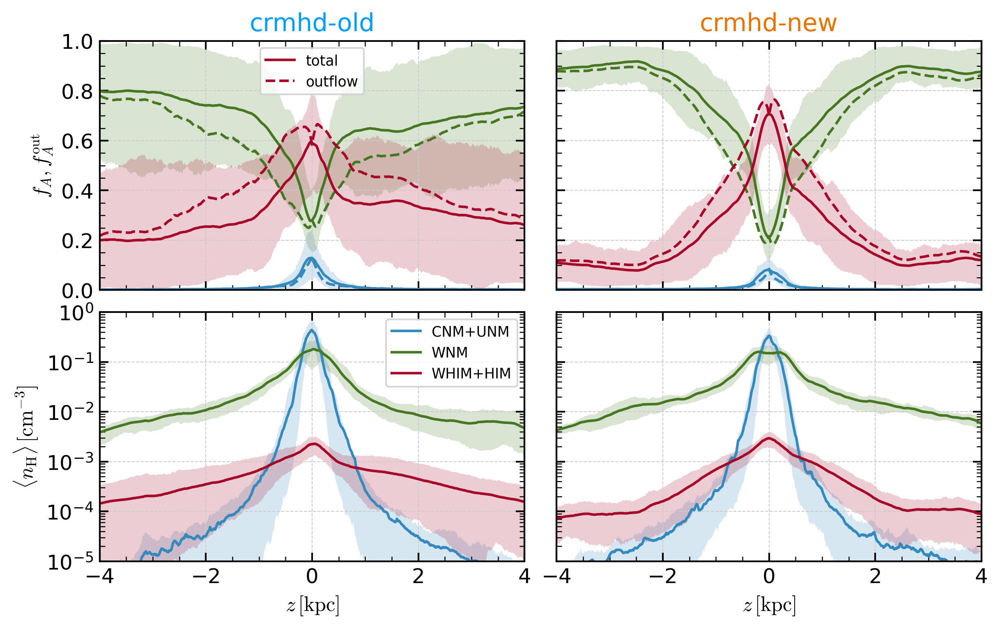

In [18]:
f=ps.plot_area_mass_fraction_z(simgroup, group)

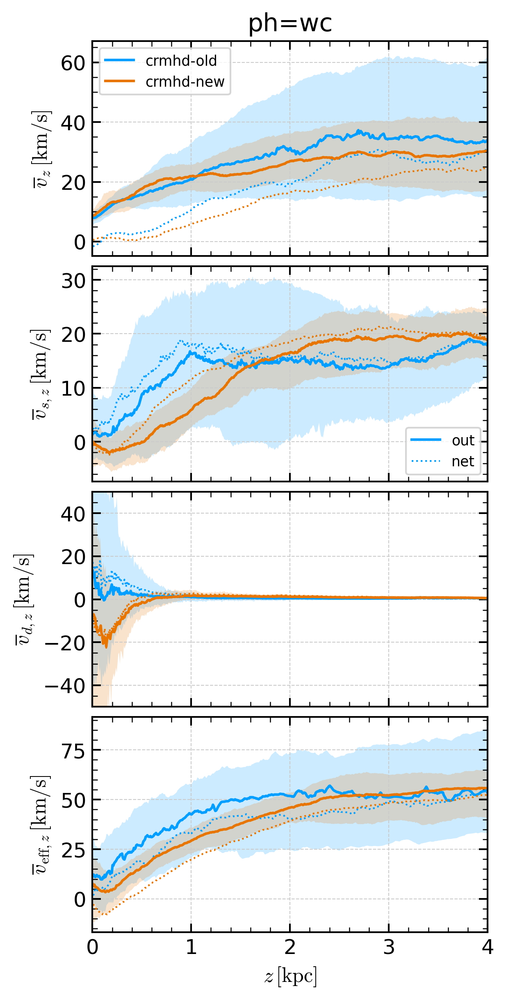

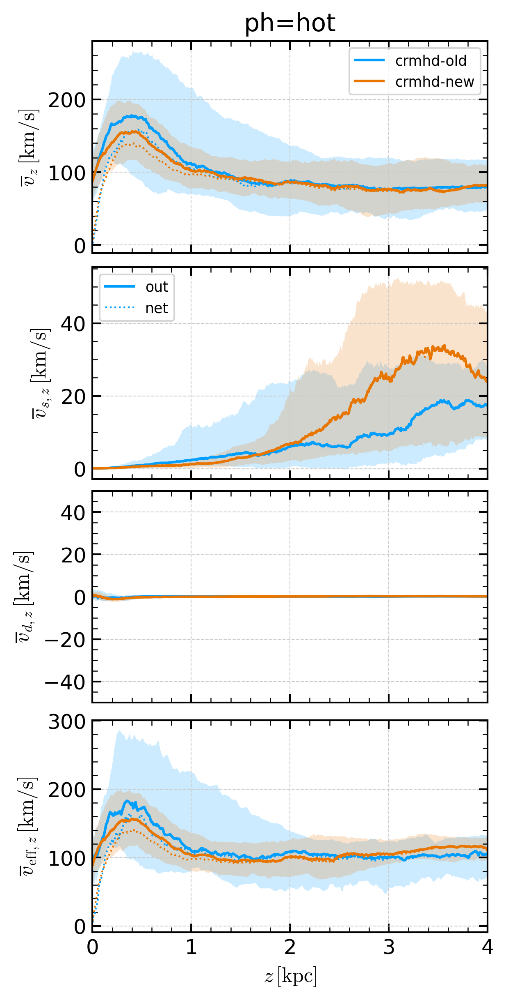

In [19]:
f=ps.plot_velocity_z(simgroup, group, ph="wc")
f=ps.plot_velocity_z(simgroup, group, ph="hot")

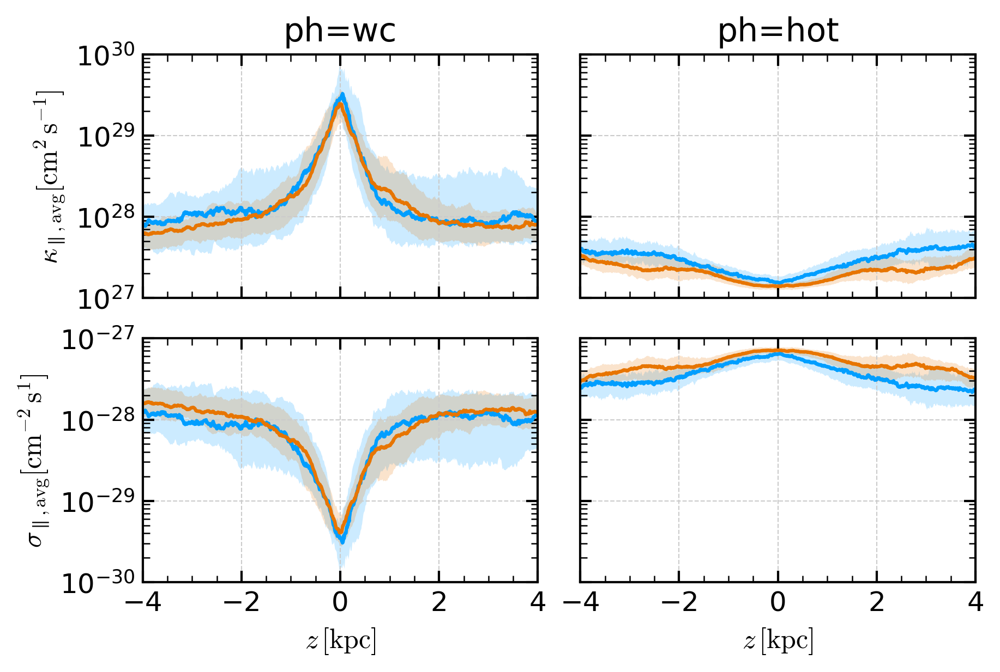

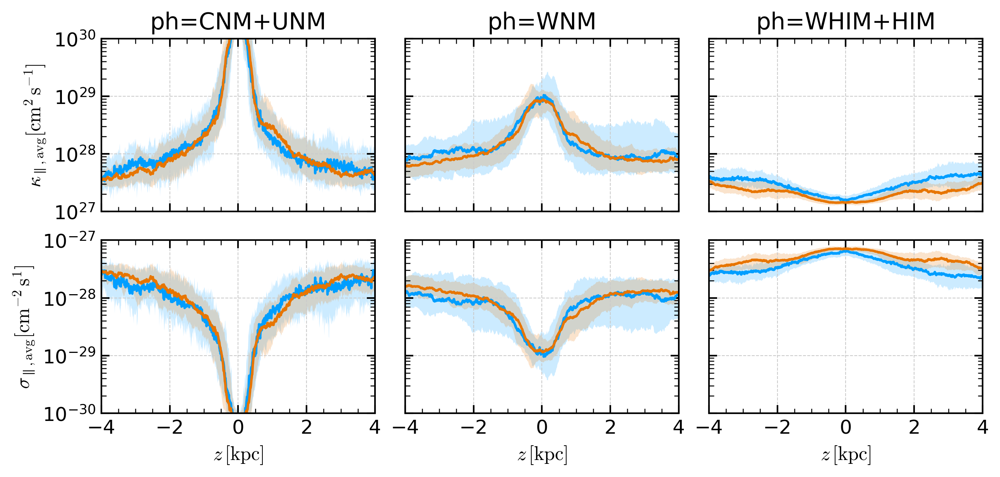

In [20]:
f=ps.plot_kappa_z(simgroup, group)
f=ps.plot_kappa_z(
    simgroup,
    group,
    phases=[["CNM", "UNM"], "WNM", ["WHIM", "HIM"]],
)

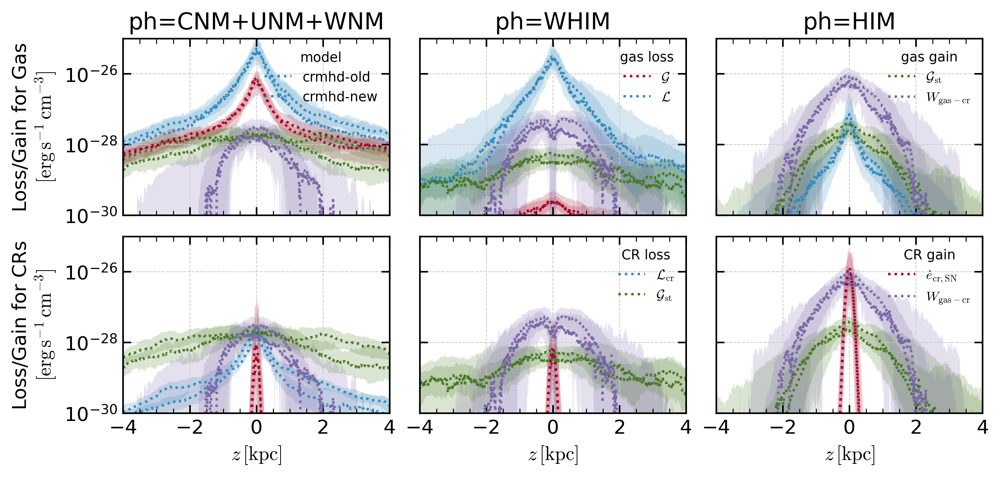

In [21]:
f=ps.plot_gainloss_z(
    simgroup,
    group,
    phases=[["CNM", "UNM", "WNM"], "WHIM", "HIM"],
)

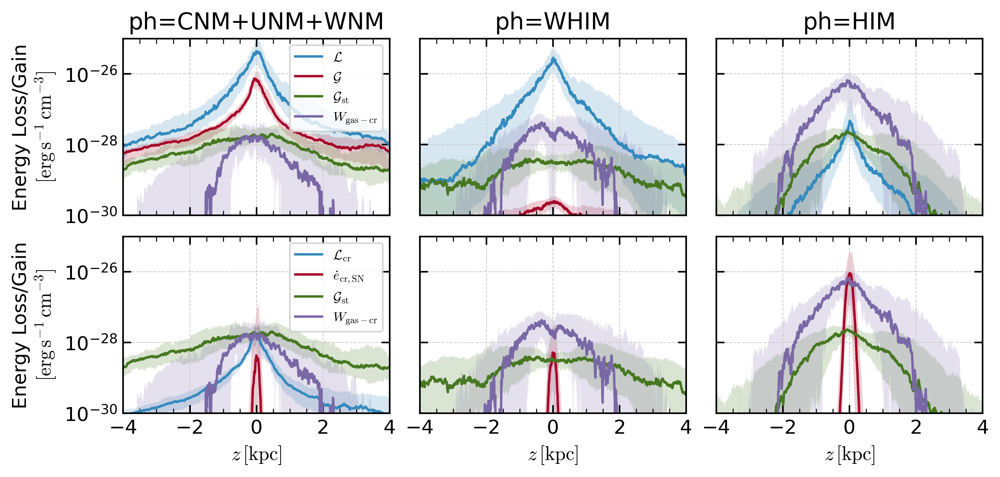

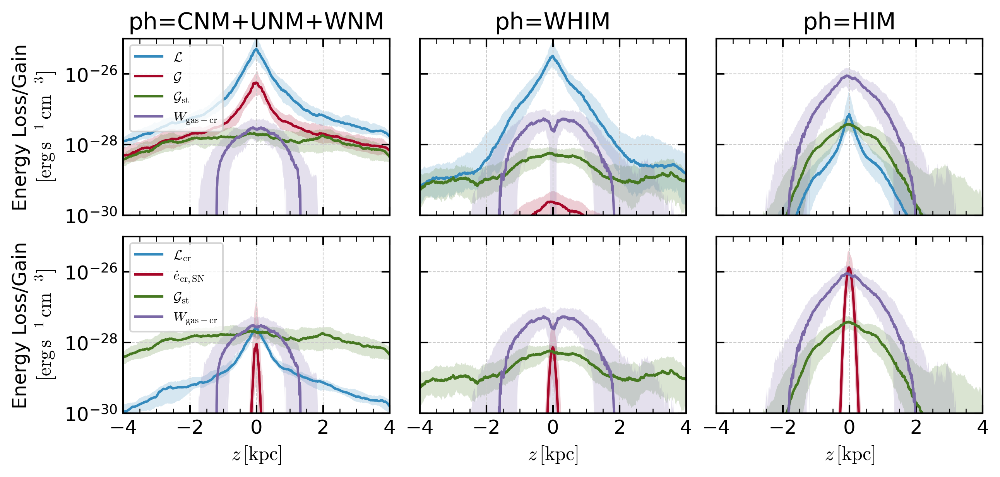

In [22]:
model_list = list(model_name.keys())
for m in model_list:
    s = sims[m]
    f=ps.plot_gainloss_z_each(
        s,
        m,
        phases=[["CNM", "UNM", "WNM"], "WHIM", "HIM"],
    )

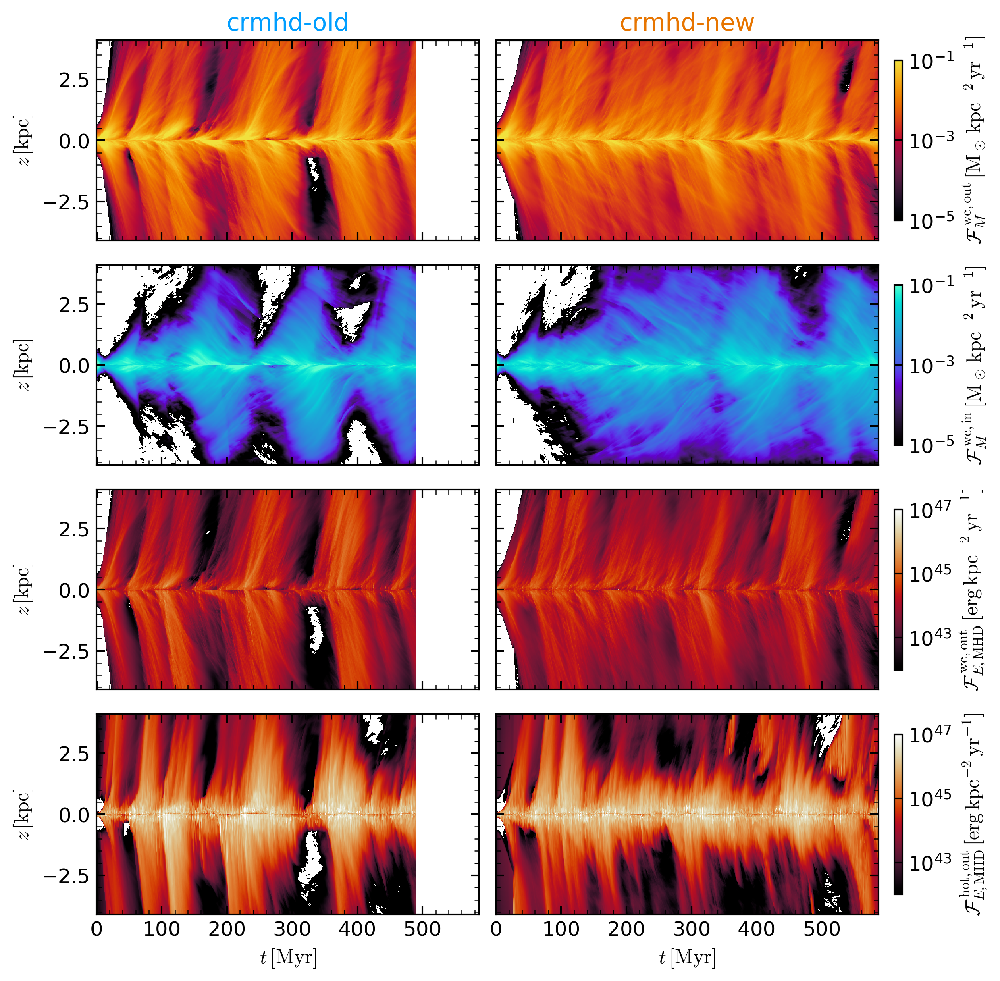

In [23]:
f=ps.plot_flux_tz(simgroup, group)

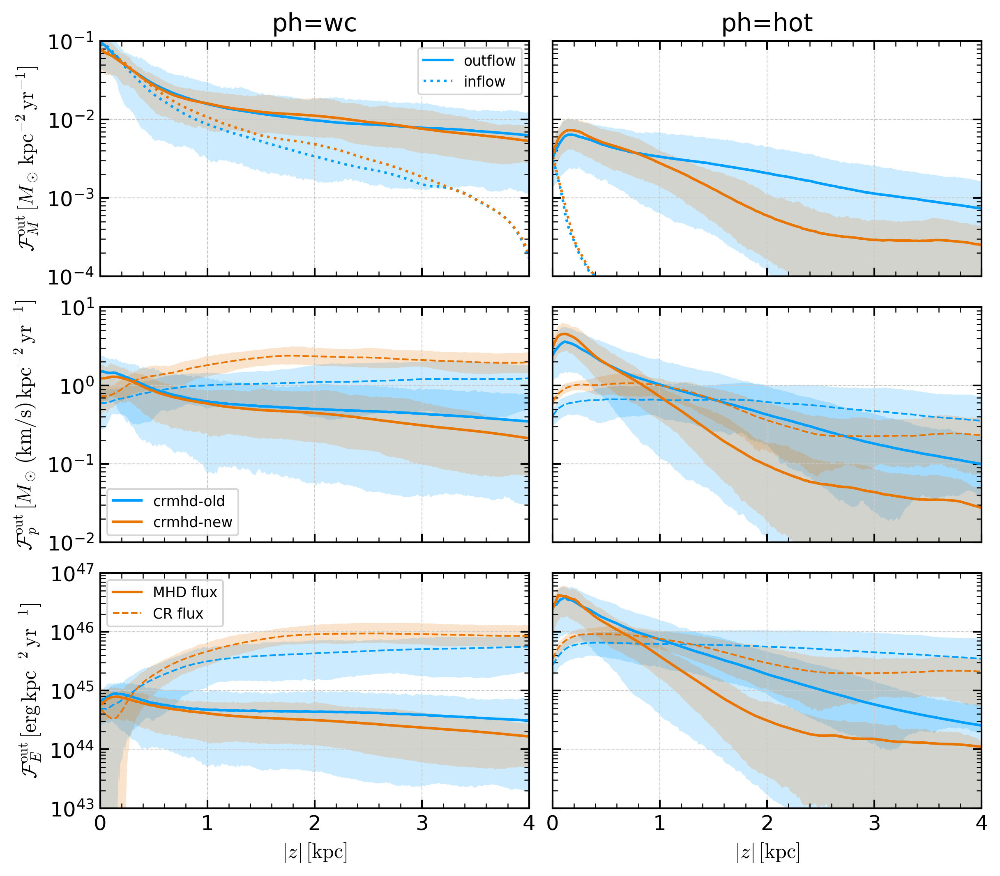

In [24]:
f=ps.plot_flux_z(simgroup, group, vz_dir=1, both=True)

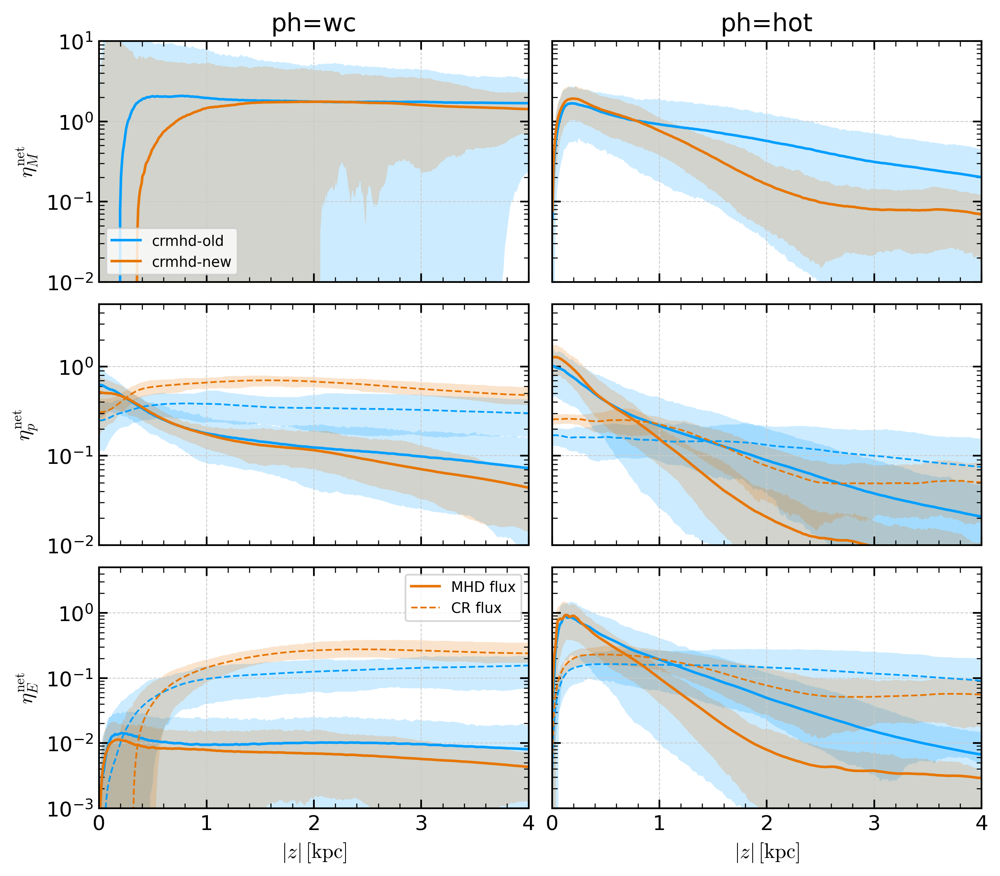

In [25]:
f=ps.plot_loading_z(simgroup, group, vz_dir=None, both=True)

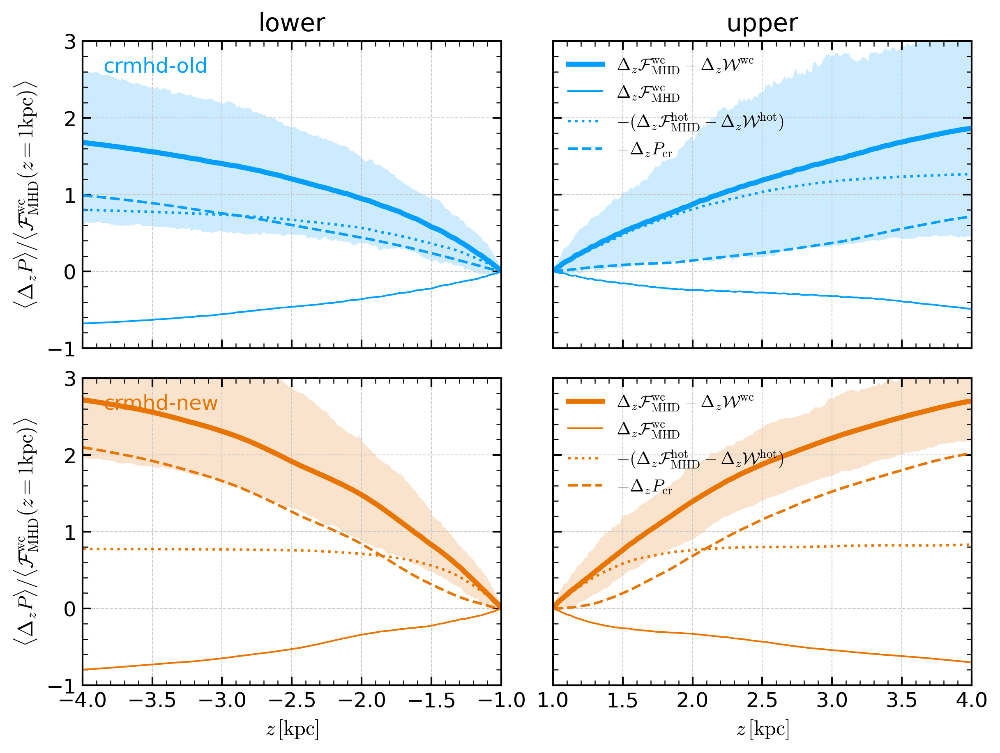

In [26]:
f=ps.plot_momentum_transfer_z(
            simgroup, group
        )

In [27]:
for m,s in sims.items():
    load_windpdf(s, both=True)

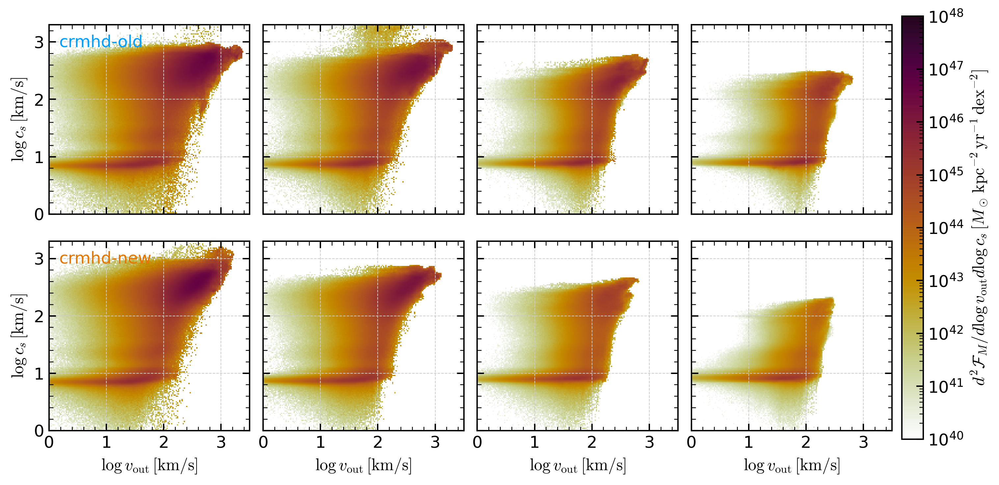

In [28]:
f=ps.plot_jointpdf(simgroup, group, flux="eflux")

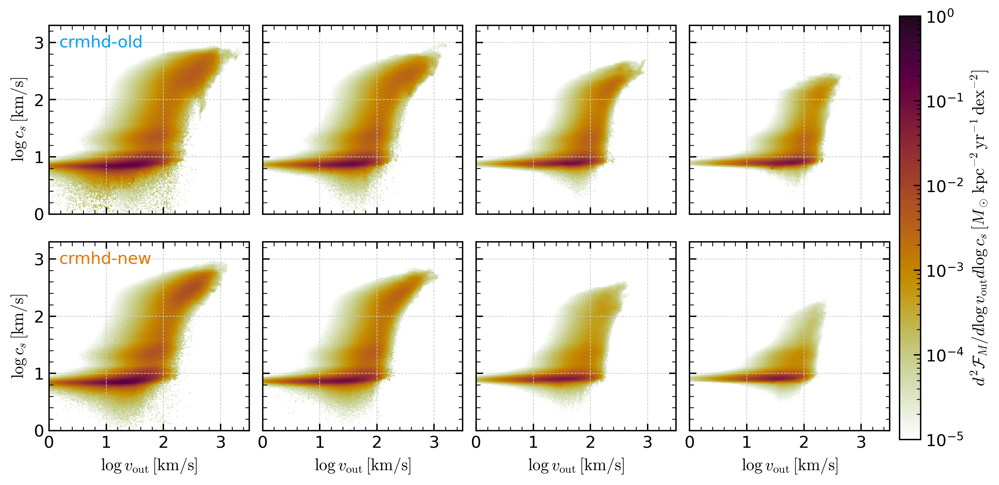

In [29]:
f=ps.plot_jointpdf(simgroup, group, flux="mflux")

In [30]:
for m, s in sims.items():
    if s.options["cosmic_ray"]:
        load_velocity_pdfs(s, xf = "T")
        load_kappa_pdfs(s,xf="T",yf="sigma_para")
        ps.plot_velocity_T(s, m)

[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-velocity3.00040.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-0-Vs3.00040.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-0-Vd3.00040.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-0-Veff3.00040.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-Vtotz.00040.nc
[LoadSimTIGRESSPP-INFO] Read from existing netcdf: /scratch/gpfs/changgoo/tigress_classic/crmhd_v2-8pc-b1-mhdbc_diode-crbc_lngrad_out-icpx/pdf/T-velocity3.00041.nc
[LoadSimTIGRESSPP-INFO] Read f

NameError: name 'load_kappa_pdfs' is not defined